<a href="https://colab.research.google.com/github/Riverag0011/ADS-504-02-Machine-Learning-Deep-Learning-For-Data-Science/blob/main/Final_Project_Team_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Final Project Team 6: Bad Cell Classification Model**

Names: Gabi Rivera, Itzel Cruz, and Edgar Rosales\
Course: ADS504-02 Machine Learning and Deep Learning

## General Information

This project aims to improve the accuracy of an existing Human Protein Atlas (HPA) cell recognition algorithm by addressing segmentation errors. The focus is on developing a machine learning model capable of identifying populations of human cells that have been incorrectly segmented. Specifically, the model will target instances where cell structures are challenging to identify accurately, such as overlapping cells, irregular shapes, or varying intensities.


In [ ]:
#Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
!pip install klib
!import klib
!pip install tabulate
from tabulate import tabulate
import klib
import warnings
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import PowerTransformer
from sklearn.svm import SVC
!pip install imblearn
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score


warnings.filterwarnings("ignore")

/bin/bash: line 1: import: command not found


In [ ]:
# Upload Meta Data
df = pd.read_csv('cell_stats_with_gt.csv')
df.head()

,Id,isBad,heights,widths,aspect_ratios,bbox_areas,mask_areas,mask_perimeters,compactnesses,red_pts,...,red_pts_mean,green_pts_mean,blue_pts_mean,yellow_pts_mean,red_pts_max,green_pts_max,blue_pts_max,yellow_pts_max,max_bg,max_dim
0,40b819ec-bbb5-11e8-b2ba-ac1f6b6435d0_bbox_1374...,0,579,471,1.229299,272709,155022,1445,1348.141111,200903,...,26.823581,20.574858,16.353864,19.954296,255,255,255,255,189719,579
1,40b819ec-bbb5-11e8-b2ba-ac1f6b6435d0_bbox_82_1...,0,759,491,1.545825,372669,263655,1773,1868.689478,272478,...,45.072501,25.781699,9.198616,36.508542,255,255,255,255,271587,759
2,40b819ec-bbb5-11e8-b2ba-ac1f6b6435d0_bbox_1424...,0,623,495,1.258586,308385,142551,1564,1145.363617,231746,...,40.725113,30.762884,16.431908,41.164061,255,255,255,255,222357,623
3,40b819ec-bbb5-11e8-b2ba-ac1f6b6435d0_bbox_850_...,0,587,439,1.337130,257693,167007,1380,1520.776708,223590,...,33.357604,28.960468,14.825696,29.261559,255,255,255,255,211428,587
4,40b819ec-bbb5-11e8-b2ba-ac1f6b6435d0_bbox_290_...,0,791,507,1.560158,401037,237002,1764,1688.353157,307845,...,32.798607,27.674748,19.567130,22.804572,255,255,255,255,296375,791


In [ ]:
# General Information
cell_status = df
cell_status.info()
cell_status.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10533 entries, 0 to 10532
Data columns (total 28 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               10533 non-null  object 
 1   isBad            10533 non-null  int64  
 2   heights          10533 non-null  int64  
 3   widths           10533 non-null  int64  
 4   aspect_ratios    10533 non-null  float64
 5   bbox_areas       10533 non-null  int64  
 6   mask_areas       10533 non-null  int64  
 7   mask_perimeters  10533 non-null  int64  
 8   compactnesses    10533 non-null  float64
 9   red_pts          10533 non-null  int64  
 10  green_pts        10533 non-null  int64  
 11  blue_pts         10533 non-null  int64  
 12  yellow_pts       10533 non-null  int64  
 13  red_ratio        10533 non-null  float64
 14  green_ratio      10533 non-null  float64
 15  blue_ratio       10533 non-null  float64
 16  yellow_ratio     10533 non-null  float64
 17  gb2all_ratio

,isBad,heights,widths,aspect_ratios,bbox_areas,mask_areas,mask_perimeters,compactnesses,red_pts,green_pts,...,red_pts_mean,green_pts_mean,blue_pts_mean,yellow_pts_mean,red_pts_max,green_pts_max,blue_pts_max,yellow_pts_max,max_bg,max_dim
count,10533.000000,10533.000000,10533.000000,10533.000000,1.053300e+04,10533.000000,10533.000000,10533.000000,1.053300e+04,1.053300e+04,...,10533.000000,10533.000000,10533.000000,10533.000000,10533.000000,10533.000000,10533.000000,10533.000000,1.053300e+04,10533.000000
mean,0.200987,388.589196,387.664768,1.134730,1.689077e+05,95710.777366,1055.763790,1041.025175,1.271260e+05,1.054496e+05,...,25.855552,19.010941,24.263599,26.265069,227.541441,224.176873,205.436343,225.813728,1.066541e+05,458.990506
std,0.400758,195.835398,194.898937,0.662509,1.570042e+05,80300.093182,552.007784,426.675392,1.209523e+05,1.019405e+05,...,14.859445,15.610970,17.324462,14.526722,50.403702,52.170433,61.762675,53.027258,1.015860e+05,212.125818
min,0.000000,37.000000,23.000000,0.103056,6.825000e+03,5492.000000,97.000000,202.438368,7.000000e+00,1.170000e+02,...,0.001032,0.015107,0.008642,0.182212,2.000000,5.000000,2.000000,10.000000,1.431000e+03,86.000000
25%,0.000000,249.000000,251.000000,0.745833,6.720000e+04,42667.000000,662.000000,739.708358,4.950900e+04,4.175700e+04,...,15.059133,7.795207,11.679846,15.444955,220.000000,208.000000,164.000000,216.000000,4.344800e+04,307.000000
50%,0.000000,347.000000,346.000000,1.000000,1.197960e+05,71840.000000,946.000000,958.859407,8.830800e+04,7.541400e+04,...,23.421683,15.490704,21.492674,24.291322,255.000000,255.000000,233.000000,255.000000,7.632500e+04,418.000000
75%,0.000000,482.000000,487.000000,1.346604,2.150160e+05,121803.000000,1342.000000,1246.842853,1.616700e+05,1.355580e+05,...,34.147965,25.881093,32.894018,34.803906,255.000000,255.000000,255.000000,255.000000,1.361720e+05,567.000000
max,1.000000,1955.000000,1879.000000,21.478261,2.762130e+06,902307.000000,6474.000000,4160.161836,1.583108e+06,1.643200e+06,...,150.405891,191.270706,202.777328,101.931111,255.000000,255.000000,255.000000,255.000000,1.643200e+06,1955.000000


## Exploratory Data Analysis

In [ ]:
# Identify if there are any missing values
klib.missingval_plot(cell_status)

No missing values found in the dataset.


Group 1 Features: Index(['isBad'], dtype='object')
Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
No columns with numeric data were detected.
Group 2 Features: Index(['heights'], dtype='object')
Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
Group 3 Features: Index(['widths'], dtype='object')
Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
Group 4 Features: Index(['aspect_ratios'], dtype='object')
Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
Group 5 Features: Index(['bbox_areas'], dtype='object')
Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
Group 6 Features: Index(['mask_areas'], dtype='object')
Large dat

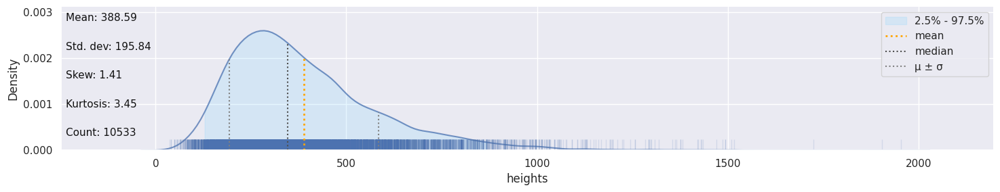

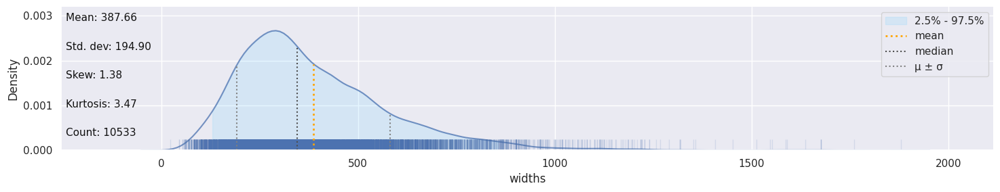

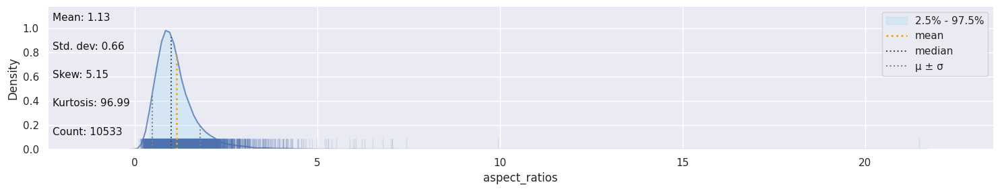

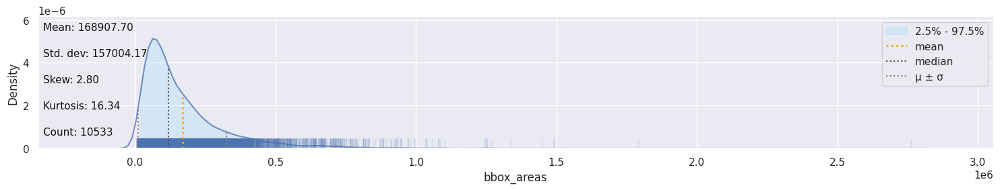

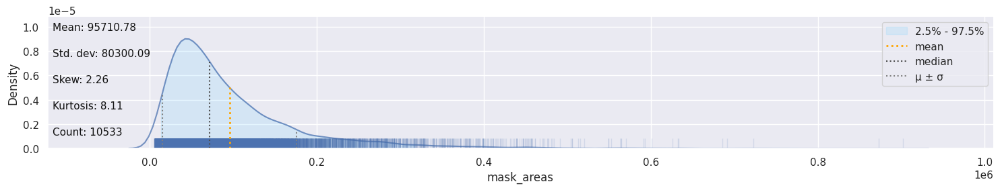

...

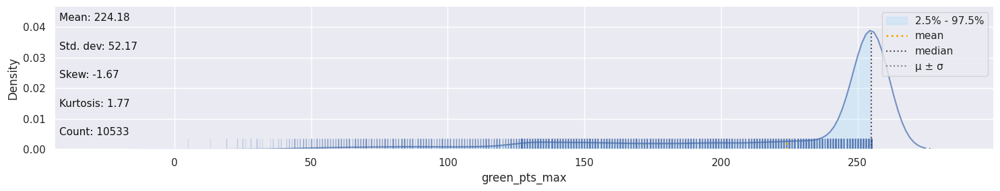

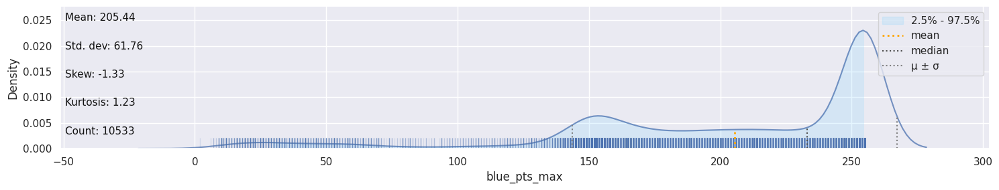

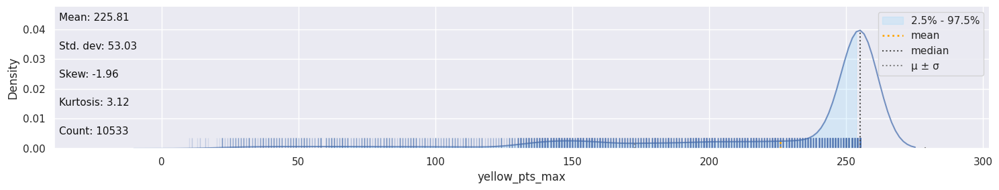

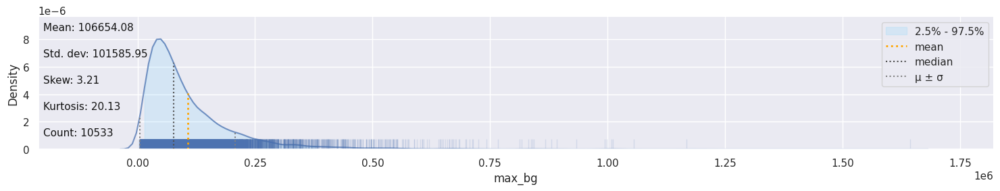

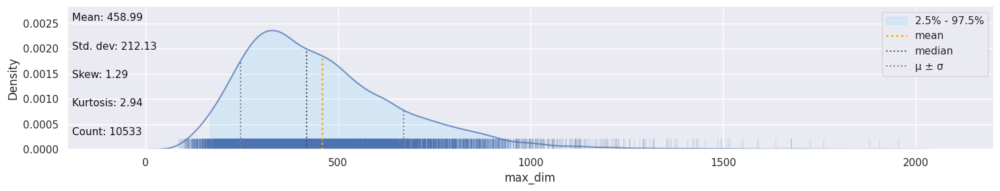

In [ ]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Plot distributions for each group of numerical features
numerical_features = cell_status.select_dtypes(include=['int', 'float']).columns
num_groups = 27
group_size = len(numerical_features) // num_groups

feature_groups = []
for i in range(num_groups):
    start_idx = i * group_size
    end_idx = (i + 1) * group_size
    group_features = numerical_features[start_idx:end_idx]
    feature_groups.append(group_features)

for i, group_features in enumerate(feature_groups):
    print(f"Group {i+1} Features: {group_features}")
    klib.dist_plot(cell_status[group_features], showall=True)

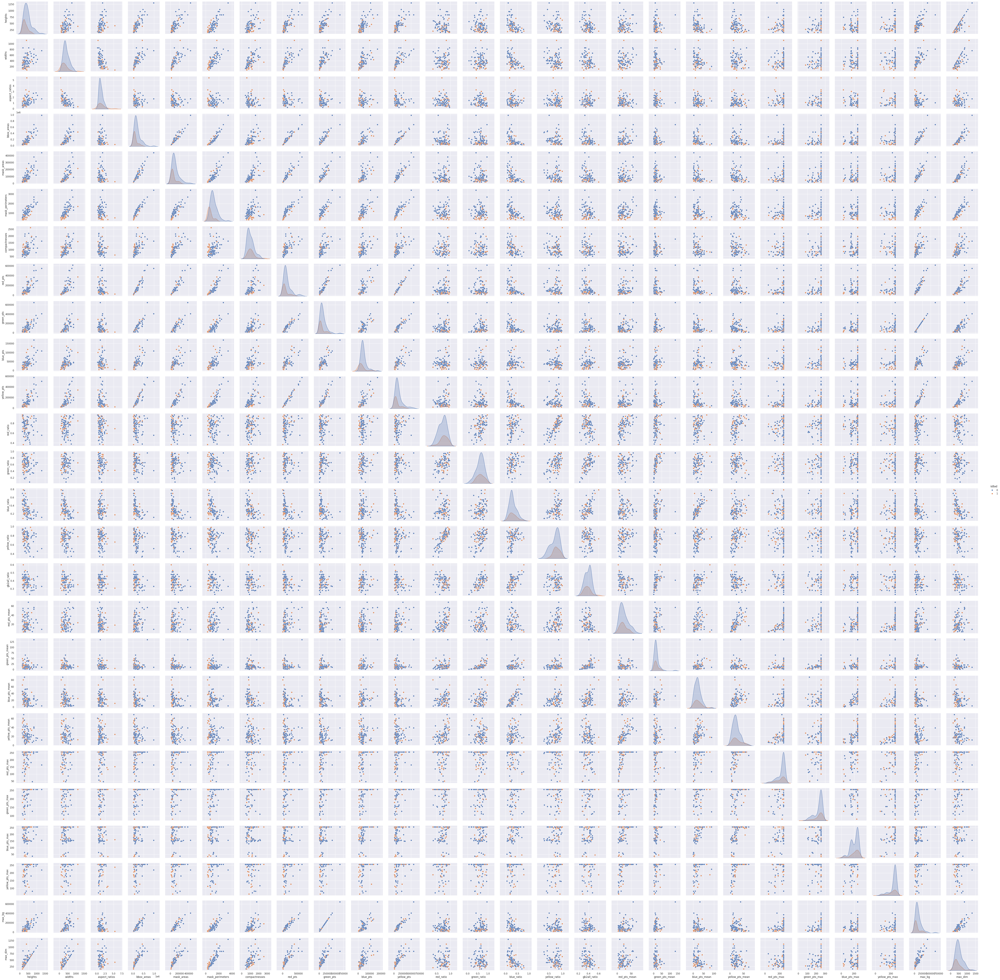

In [ ]:
# Pairplot with respect to isBad
sampled_data = cell_status.sample(n= 100)
sns.pairplot(sampled_data, hue='isBad')
plt.show()

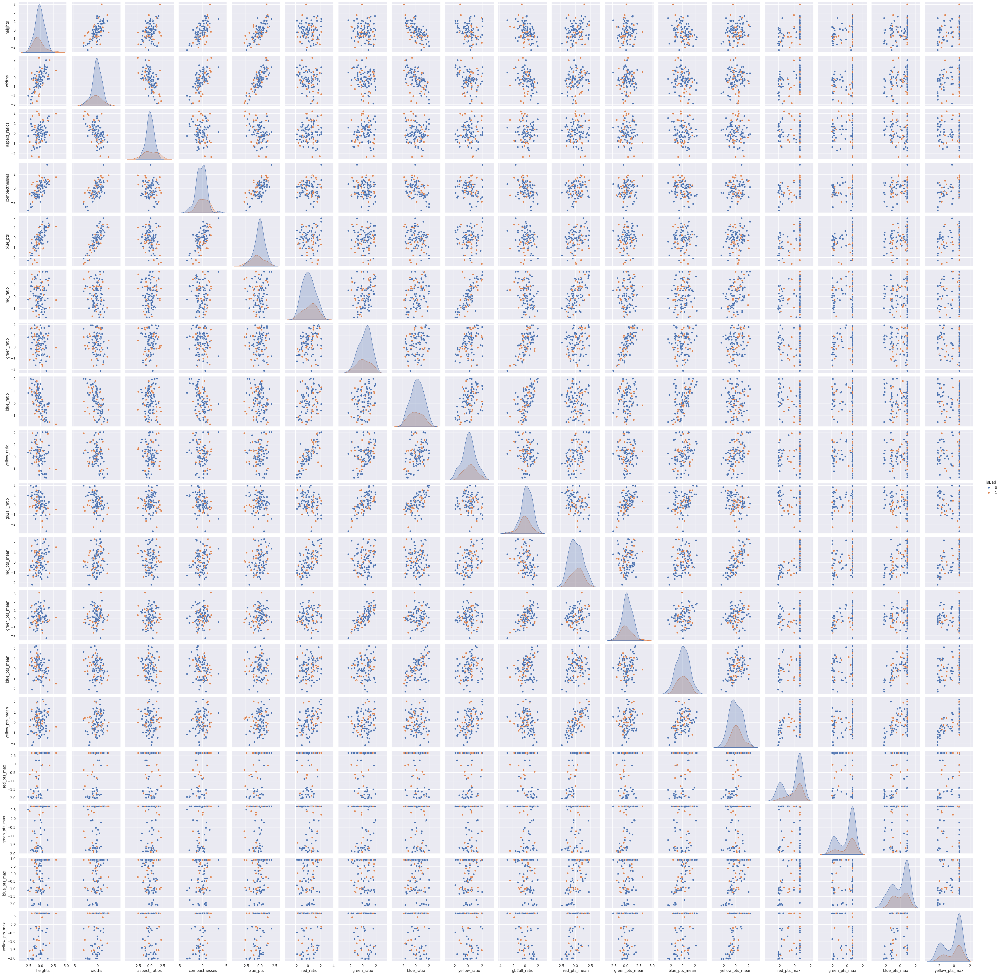

In [ ]:
#### SHOULD BE RUN AFTER DATA WRANGLING #####

# Pairplot with respect to isBad
processed_df['isBad'] = data_reduced['isBad']
sampled_data = processed_df.sample(n= 100)
sns.pairplot(sampled_data, hue='isBad')
plt.show()

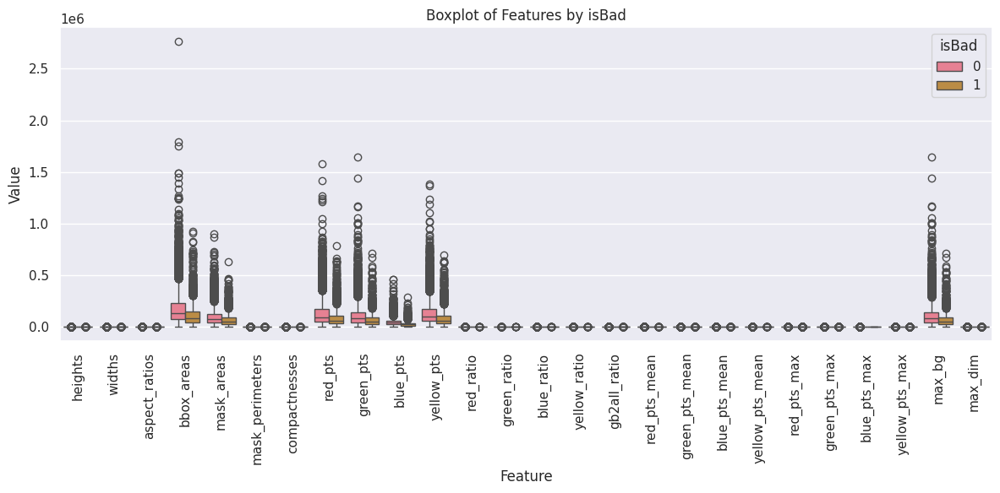

In [ ]:
# Melt the dataframe to long format for easier plotting
df_melted = pd.melt(cell_status, id_vars=['isBad'],
                    value_vars=cell_status.columns[2:],
                    var_name='feature', value_name='value')

custom_palette = sns.husl_palette(8)
plt.figure(figsize=(12, 6))
sns.boxplot(x='feature', y='value', hue='isBad', data=df_melted,
            palette=custom_palette)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Value')
plt.title('Boxplot of Features by isBad')
plt.legend(title='isBad', loc='upper right')
plt.tight_layout()
plt.show()

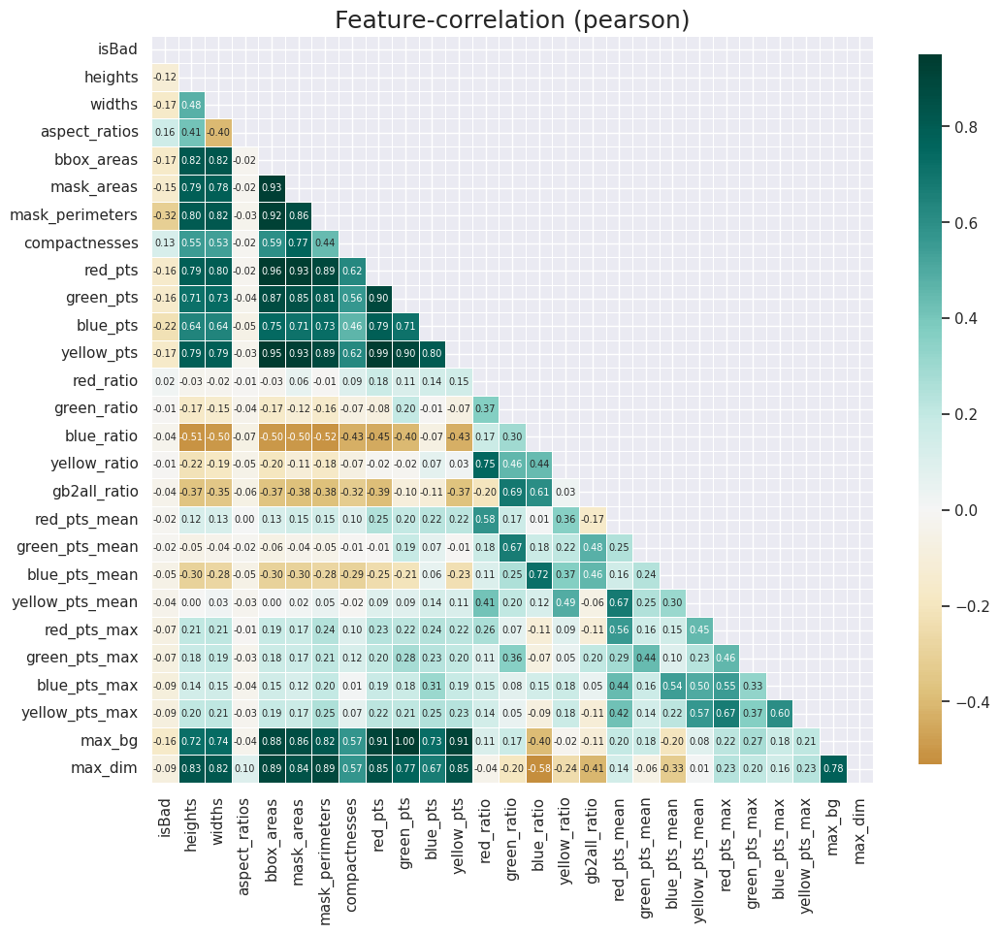

In [ ]:
# Feature Correlation (Pearson)
ax = klib.corr_plot(cell_status)
for text in ax.texts:
    text.set_fontsize(7)
plt.show()

## Pre-Processing/Data Wrangling

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Load the data
df = pd.read_csv('cell_stats_with_gt.csv')

# Inspect the data
print(df.info())
print(df.describe())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10533 entries, 0 to 10532
Data columns (total 28 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               10533 non-null  object 
 1   isBad            10533 non-null  int64  
 2   heights          10533 non-null  int64  
 3   widths           10533 non-null  int64  
 4   aspect_ratios    10533 non-null  float64
 5   bbox_areas       10533 non-null  int64  
 6   mask_areas       10533 non-null  int64  
 7   mask_perimeters  10533 non-null  int64  
 8   compactnesses    10533 non-null  float64
 9   red_pts          10533 non-null  int64  
 10  green_pts        10533 non-null  int64  
 11  blue_pts         10533 non-null  int64  
 12  yellow_pts       10533 non-null  int64  
 13  red_ratio        10533 non-null  float64
 14  green_ratio      10533 non-null  float64
 15  blue_ratio       10533 non-null  float64
 16  yellow_ratio     10533 non-null  float64
 17  gb2all_ratio

### Feature Selection and Transformation

In [ ]:
# Drop unnecessary predictors
pre_df = df.drop(columns=['Id'])

In [ ]:
# Convert relevant columns to numeric type before calculating correlation
numeric_columns = pre_df.select_dtypes(include=['number']).columns
pre_df[numeric_columns] = pre_df[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
correlation_matrix = pre_df[numeric_columns].corr()

# Identify features with high correlation (threshold > 0.8)
high_corr_features = set()
correlation_threshold = 0.8

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            colname = correlation_matrix.columns[i]
            high_corr_features.add(colname)

# Assuming 'cell_status' is the original DataFrame you want to reduce
data_reduced = pre_df.drop(columns=high_corr_features)

# Display the remaining features
remaining_features = data_reduced.columns
print(remaining_features)

Index(['isBad', 'heights', 'widths', 'aspect_ratios', 'compactnesses',
       'blue_pts', 'red_ratio', 'green_ratio', 'blue_ratio', 'yellow_ratio',
       'gb2all_ratio', 'red_pts_mean', 'green_pts_mean', 'blue_pts_mean',
       'yellow_pts_mean', 'red_pts_max', 'green_pts_max', 'blue_pts_max',
       'yellow_pts_max'],
      dtype='object')


In [ ]:
# Import the required library
from scipy.stats import skew

# Identify numerical columns
numerical_cols = data_reduced.select_dtypes(include=['int64', 'float64']).columns

# Calculate skewness for each numerical feature
skewness_scores = data_reduced[numerical_cols].apply(skew)

# Display the skewness scores
print("Skewness scores for numerical features:")
print(skewness_scores)

Skewness scores for numerical features:
isBad              1.492307
heights            1.408004
widths             1.379608
aspect_ratios      5.153433
compactnesses      1.478885
blue_pts           2.653632
red_ratio         -0.648513
green_ratio       -0.580910
blue_ratio         0.699210
yellow_ratio      -0.757554
gb2all_ratio      -0.672435
red_pts_mean       1.045377
green_pts_mean     2.076013
blue_pts_mean      1.557051
yellow_pts_mean    0.831373
red_pts_max       -2.020581
green_pts_max     -1.670824
blue_pts_max      -1.330121
yellow_pts_max    -1.958703
dtype: float64


### Box-Cox Transformation

In [ ]:
# Import the required library
from scipy.stats import skew, boxcox # Import the boxcox function

# Identify numerical columns
reduced_df1 = data_reduced.drop('isBad', axis=1)
outcome = data_reduced['isBad']
numerical_cols = reduced_df1.select_dtypes(include=['int64', 'float64']).columns

# Apply Box-Cox transformation
# Note: Box-Cox requires input data to be positive
boxcox_transformed_data = reduced_df1[numerical_cols].apply(lambda x: boxcox(x + 1)[0] if (x > 0).all() else x)

# Display the transformed data
print("Box-Cox transformed data:")
print(boxcox_transformed_data.head())

# If you prefer using sklearn's PowerTransformer, which includes Box-Cox as one of the options:
# Note: The PowerTransformer automatically shifts data to be positive if it contains zero or negative values

reduced_df2 = data_reduced.drop('isBad', axis=1)
outcome = data_reduced['isBad']
numerical_cols = reduced_df2.select_dtypes(include=['int64', 'float64']).columns
power_transformer = PowerTransformer(method='box-cox', standardize=False)
transformed_data = power_transformer.fit_transform(reduced_df2[numerical_cols] + 1)

# Convert the transformed data back to a DataFrame
transformed_df = pd.DataFrame(transformed_data, columns=numerical_cols)

# Display the transformed data using sklearn's PowerTransformer
print("Box-Cox transformed data using sklearn's PowerTransformer:")
print(transformed_df.head())

Box-Cox transformed data:
    heights     widths  aspect_ratios  compactnesses   blue_pts  red_ratio  \
0  9.029954  10.159210       0.536156       5.239627  39.103746   1.865320   
1  9.562225  10.264724       0.588137       5.403161  42.858389   1.839761   
2  9.172474  10.285389       0.541603       5.156109  43.899579   1.934658   
3  9.056572   9.982213       0.555511       5.300556  40.742349   2.538578   
4  9.644771  10.346545       0.590175       5.352864  43.334840   2.012207   

   green_ratio  blue_ratio  yellow_ratio  gb2all_ratio  red_pts_mean  \
0     1.252570    0.162490      1.766688      0.721851      6.860456   
1     1.344787    0.175641      2.237284      0.726846      8.922776   
2     1.322947    0.220104      2.028751      0.782146      8.484568   
3     1.618531    0.196003      2.738361      0.719264      7.673592   
4     1.374082    0.172403      2.136342      0.720417      7.607912   

   green_pts_mean  blue_pts_mean  yellow_pts_mean   red_pts_max  \
0    

In [ ]:
# Calculate the new skewness scores for the transformed features
new_skewness_scores = transformed_df.apply(skew)

# Display the new skewness scores
print("New skewness scores using PowerTransform:")
print(new_skewness_scores)

New skewness scores using PowerTransform:
heights            0.001325
widths             0.003030
aspect_ratios     -0.008009
compactnesses     -0.001961
blue_pts           0.033165
red_ratio         -0.054577
green_ratio       -0.105897
blue_ratio         0.031022
yellow_ratio      -0.089167
gb2all_ratio       0.107105
red_pts_mean      -0.005266
green_pts_mean    -0.015376
blue_pts_mean     -0.013497
yellow_pts_mean   -0.018703
red_pts_max       -1.098482
green_pts_max     -0.976335
blue_pts_max      -0.602641
yellow_pts_max    -1.090265
dtype: float64


### Center and Scaling

In [ ]:
# Standardize the numeric features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(transformed_df)

# Convert processed features back to DataFrame
processed_df = pd.DataFrame(scaled_features, columns=transformed_df.columns,
                            index=transformed_df.index)

# Check the processed data
print(processed_df.info())
print(processed_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10533 entries, 0 to 10532
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   heights          10533 non-null  float64
 1   widths           10533 non-null  float64
 2   aspect_ratios    10533 non-null  float64
 3   compactnesses    10533 non-null  float64
 4   blue_pts         10533 non-null  float64
 5   red_ratio        10533 non-null  float64
 6   green_ratio      10533 non-null  float64
 7   blue_ratio       10533 non-null  float64
 8   yellow_ratio     10533 non-null  float64
 9   gb2all_ratio     10533 non-null  float64
 10  red_pts_mean     10533 non-null  float64
 11  green_pts_mean   10533 non-null  float64
 12  blue_pts_mean    10533 non-null  float64
 13  yellow_pts_mean  10533 non-null  float64
 14  red_pts_max      10533 non-null  float64
 15  green_pts_max    10533 non-null  float64
 16  blue_pts_max     10533 non-null  float64
 17  yellow_pts_m

## Data Splitting: 20% Test Set and 80% Train Set

In [ ]:
# Split the data into features and target
X = processed_df
y = data_reduced['isBad']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=42)

# Check the class distribution in the training set
print("Training set class distribution before balancing:")
print(y_train.value_counts())

# Create resampling pipelines
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the class distribution in the balanced training set
print("Training set class distribution after balancing:")
print(pd.Series(y_train_resampled).value_counts())

# Display the shapes of the training and testing sets
print(f"Shape of X_train_resampled: {X_train_resampled.shape}")
print(f"Shape of y_train_resampled: {y_train_resampled.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_test: {y_test.shape}")

Training set class distribution before balancing:
isBad
0    6718
1    1708
Name: count, dtype: int64
Training set class distribution after balancing:
isBad
0    6718
1    6718
Name: count, dtype: int64
Shape of X_train_resampled: (13436, 18)
Shape of y_train_resampled: (13436,)
Shape of X_test: (2107, 18)
Shape of y_test: (2107,)


## Model Strategies



### K-Means


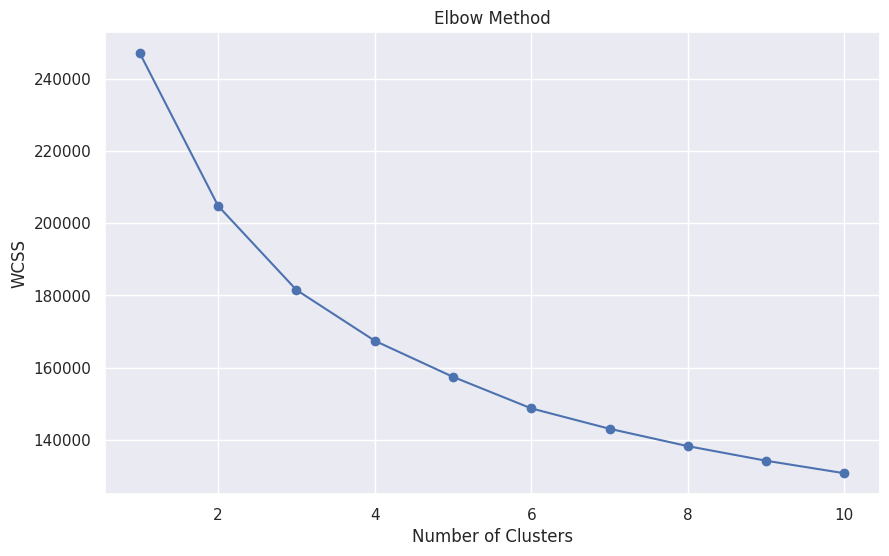

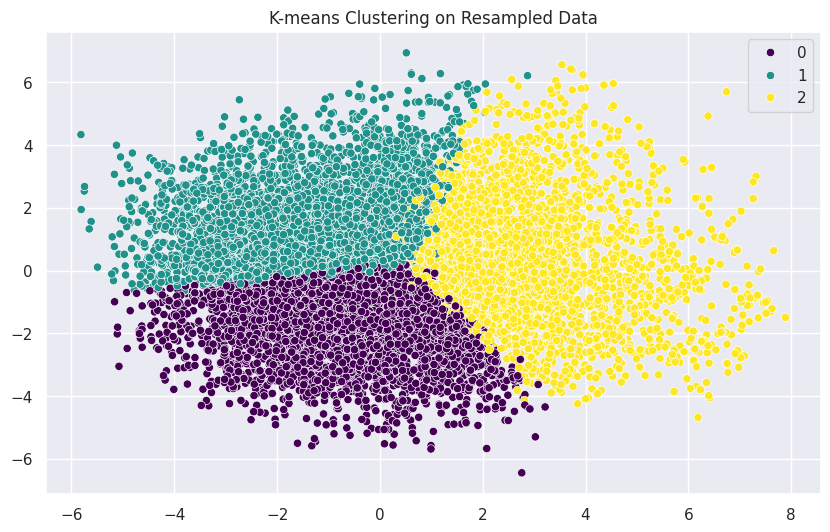

,Id,isBad,heights,widths,aspect_ratios,bbox_areas,mask_areas,mask_perimeters,compactnesses,red_pts,...,green_pts_mean,blue_pts_mean,yellow_pts_mean,red_pts_max,green_pts_max,blue_pts_max,yellow_pts_max,max_bg,max_dim,Cluster
0,NaN,NaN,2.123474,1.110710,0.986894,NaN,NaN,NaN,1.226141,NaN,...,0.897574,0.338389,0.637428,0.653642,0.686076,0.923699,0.653209,NaN,NaN,0
1,NaN,NaN,-0.632257,-1.352069,0.840110,NaN,NaN,NaN,-1.956200,NaN,...,-0.608860,0.742435,-0.040402,-1.612948,-1.143547,-1.003528,-0.445799,NaN,NaN,1
2,NaN,NaN,-0.586412,-0.182546,-0.445818,NaN,NaN,NaN,-0.919365,NaN,...,0.161801,1.598806,0.216452,0.653642,0.639735,0.923699,-0.477252,NaN,NaN,1
3,NaN,NaN,0.076344,-0.201307,0.300363,NaN,NaN,NaN,-0.816996,NaN,...,-1.193748,-0.181858,-0.159972,0.082408,0.686076,-0.942590,0.653209,NaN,NaN,2
4,NaN,NaN,0.109894,0.565904,-0.487092,NaN,NaN,NaN,3.049146,NaN,...,0.837753,0.090063,0.412629,0.653642,0.686076,0.480136,0.653209,NaN,NaN,0


In [ ]:
# Import necessary libraries for clustering and visualization
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Determine the optimal number of clusters using the Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_train_resampled)  # Use X_train_resampled for fitting the model
    wcss.append(kmeans.inertia_)

# Plot the Elbow graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Fit the K-means model with the optimal number of clusters (let's assume K=3 for this example)
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(X_train_resampled)  # Use X_train_resampled for fitting and predicting

# Create a new DataFrame from the resampled data
resampled_df = pd.DataFrame(X_train_resampled, columns=df.columns)  # Use the same columns as the original df
resampled_df['Cluster'] = cluster_labels  # Add cluster labels to this new DataFrame

# Visualize the clusters using PCA (on resampled data)
pca = PCA(n_components=2)
pca_features = pca.fit_transform(X_train_resampled)  # Use X_train_resampled for PCA

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1], hue=cluster_labels, palette='viridis')
plt.title('K-means Clustering on Resampled Data')
plt.show()

# Display the first few rows of the new resampled dataframe with cluster labels
resampled_df.head()


K-means AUC-ROC Score: 0.40960384862386645


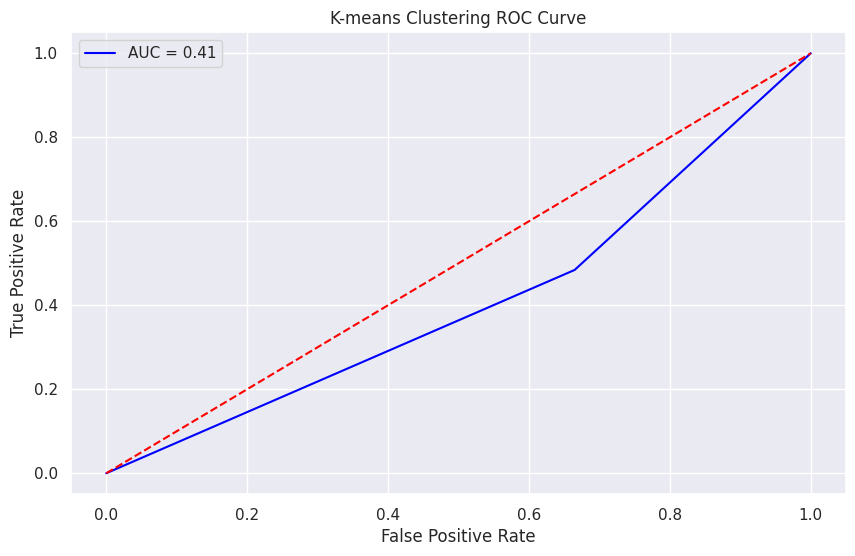

In [ ]:
# Import necessary libraries
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

# For binary classification, we'll use 2 clusters
n_clusters = 2

# Fit K-means clustering with 2 clusters on the training data
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels_train = kmeans.fit_predict(X_train_resampled)  # Use X_train_resampled for fitting the model

# Predict clusters for the test data
kmeans_labels_test = kmeans.predict(X_test)  # Use X_test for predicting

# Convert cluster labels to binary classification (assuming binary target variable)
# Here we assume cluster 1 is positive class and cluster 0 is negative class for demonstration
binary_labels_train = (kmeans_labels_train == 1).astype(int)
binary_labels_test = (kmeans_labels_test == 1).astype(int)

# Calculate AUC-ROC score for K-means
auc_score_kmeans = roc_auc_score(y_test, binary_labels_test)
print(f'K-means AUC-ROC Score: {auc_score_kmeans}')

# Plotting the ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, binary_labels_test)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc_score_kmeans:.2f}')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-means Clustering ROC Curve')
plt.legend()
plt.show()


### Agglomerative Clustering

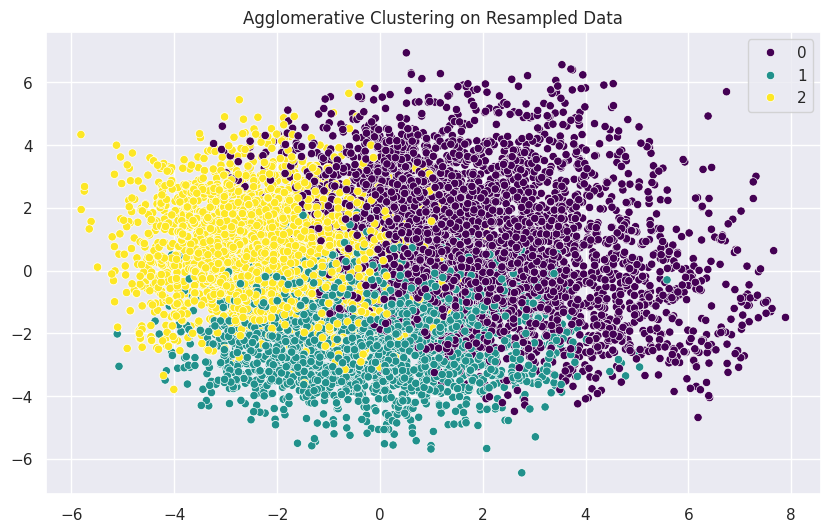

,Id,isBad,heights,widths,aspect_ratios,bbox_areas,mask_areas,mask_perimeters,compactnesses,red_pts,...,green_pts_mean,blue_pts_mean,yellow_pts_mean,red_pts_max,green_pts_max,blue_pts_max,yellow_pts_max,max_bg,max_dim,Agg_Cluster
0,NaN,NaN,2.123474,1.110710,0.986894,NaN,NaN,NaN,1.226141,NaN,...,0.897574,0.338389,0.637428,0.653642,0.686076,0.923699,0.653209,NaN,NaN,2
1,NaN,NaN,-0.632257,-1.352069,0.840110,NaN,NaN,NaN,-1.956200,NaN,...,-0.608860,0.742435,-0.040402,-1.612948,-1.143547,-1.003528,-0.445799,NaN,NaN,0
2,NaN,NaN,-0.586412,-0.182546,-0.445818,NaN,NaN,NaN,-0.919365,NaN,...,0.161801,1.598806,0.216452,0.653642,0.639735,0.923699,-0.477252,NaN,NaN,2
3,NaN,NaN,0.076344,-0.201307,0.300363,NaN,NaN,NaN,-0.816996,NaN,...,-1.193748,-0.181858,-0.159972,0.082408,0.686076,-0.942590,0.653209,NaN,NaN,1
4,NaN,NaN,0.109894,0.565904,-0.487092,NaN,NaN,NaN,3.049146,NaN,...,0.837753,0.090063,0.412629,0.653642,0.686076,0.480136,0.653209,NaN,NaN,2


In [ ]:
# Import necessary libraries
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Define the number of clusters and linkage criterion
n_clusters = 3  # Number of clusters, can be tuned
linkage = 'ward'  # Linkage criterion: 'ward', 'complete', 'average', 'single'

# Fit the Agglomerative Clustering model on resampled data
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
agg_labels = agg_clustering.fit_predict(X_train_resampled)

# Create a new DataFrame from the resampled data
resampled_df = pd.DataFrame(X_train_resampled, columns=df.columns)  # Use the same columns as the original df
resampled_df['Agg_Cluster'] = agg_labels  # Add cluster labels to this new DataFrame

# Visualize the Agglomerative Clustering clusters (using the first two principal components for better visualization)
pca = PCA(n_components=2)
pca_features = pca.fit_transform(X_train_resampled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1], hue=agg_labels, palette='viridis')
plt.title('Agglomerative Clustering on Resampled Data')
plt.show()

# Display the first few rows of the new resampled dataframe with Agglomerative Clustering labels
resampled_df.head()


Agglomerative Clustering AUC-ROC Score: 0.43718411708294813


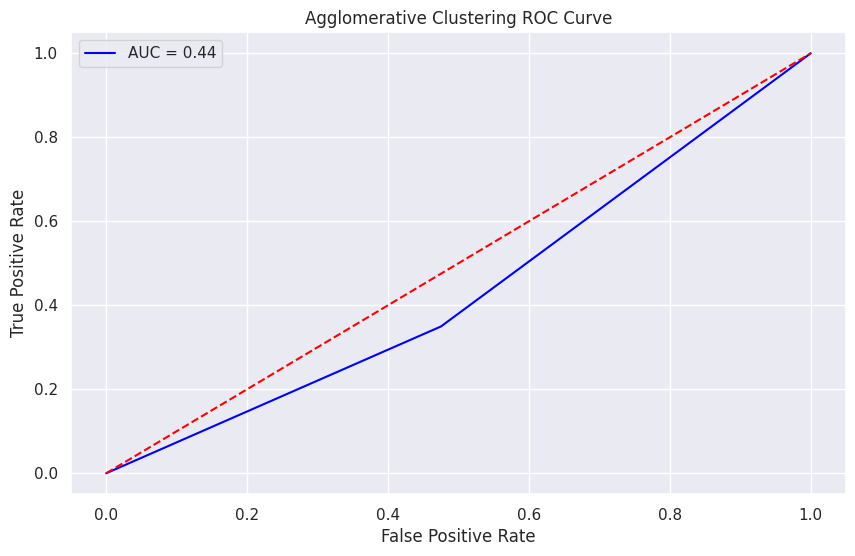

In [ ]:
# Import necessary libraries
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np

# Define the number of clusters (for binary classification, use 2 clusters)
n_clusters = 2

# Fit Agglomerative Clustering with 2 clusters on the training data
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
agg_labels_train = agg_clustering.fit_predict(X_train_resampled)

# Predict clusters for the test data
agg_labels_test = agg_clustering.fit_predict(X_test)

# Convert cluster labels to binary classification (assuming binary target variable)
binary_labels_train = (agg_labels_train == 1).astype(int)
binary_labels_test = (agg_labels_test == 1).astype(int)

# Calculate AUC-ROC score for Agglomerative Clustering
auc_score_agg = roc_auc_score(y_test, binary_labels_test)
print(f'Agglomerative Clustering AUC-ROC Score: {auc_score_agg}')

# Plotting the ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, binary_labels_test)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc_score_agg:.2f}')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Agglomerative Clustering ROC Curve')
plt.legend()
plt.show()


### Logistic Regression

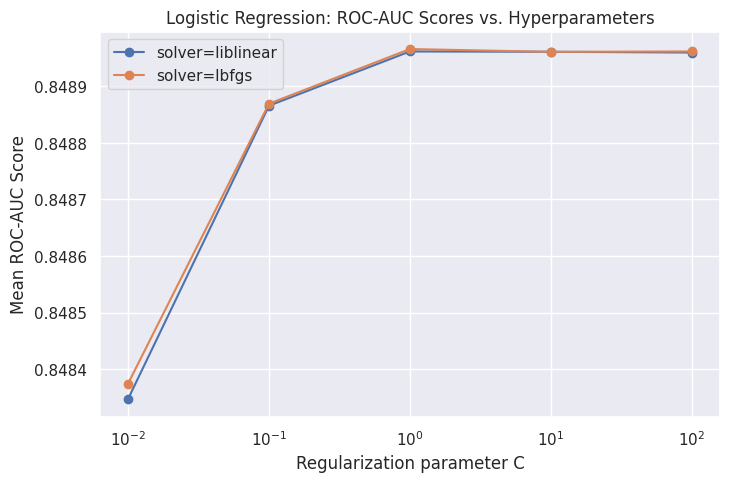

In [ ]:
# Perform hyperparameter tuning of Logistic Regression
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'lbfgs']
}

lr = LogisticRegression()
grid_search = GridSearchCV(lr, param_grid, cv=5, scoring='roc_auc',
                           return_train_score=True)
grid_search.fit(X_train_resampled, y_train_resampled)

results = grid_search.cv_results_

# Get the mean ROC-AUC scores for each parameter combination
mean_test_scores = results['mean_test_score']
param_combinations = [f"C={c}, solver={s}" for c in param_grid['C'] for s in param_grid['solver']]
mean_test_scores_reshaped = np.array(mean_test_scores).reshape(len(param_grid['C']),
                                                               len(param_grid['solver']))

# Plot ROC-AUC scores
plt.figure(figsize=(8, 5))

for i, solver in enumerate(param_grid['solver']):
    plt.plot(param_grid['C'], mean_test_scores_reshaped[:, i], marker='o',
             label=f'solver={solver}')

plt.xscale('log')
plt.xlabel('Regularization parameter C')
plt.ylabel('Mean ROC-AUC Score')
plt.title('Logistic Regression: ROC-AUC Scores vs. Hyperparameters')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [ ]:
# Final Logistic Regression Model
lr_model = LogisticRegression(C=1.0, solver='lbfgs')
lr_model.fit(X_train_resampled, y_train_resampled)

LogisticRegression()

### Neural Networks

In [ ]:
!pip install tensorflow
!pip install keras
!pip install tensorflow scikit-learn
!pip install keras-tuner

import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.4 MB/s eta 0:00:00


In [ ]:
# Define model functions
def build_model(hp):
    model = Sequential()
    model.add(Dense(
        units=hp.Int('units1', min_value=32, max_value=128, step=32),
        activation='relu',
        input_shape=(X_train_resampled.shape[1],)
    ))
    model.add(Dense(
        units=hp.Int('units2', min_value=16, max_value=64, step=16),
        activation='relu'
    ))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(hp.Float('learning_rate', min_value=1e-4, max_value=1e-1,
                                sampling='LOG')),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
# Hyperparameter tuning parameters
def tuner_search():
    tuner = kt.Hyperband(
        build_model,
        objective='val_accuracy',
        max_epochs=20,
        hyperband_iterations=2,
        overwrite=True,
        directory='keras_tuner_dir',
        project_name='binary_classification'
    )

    # Perform the search
    tuner.search(X_train_resampled, y_train_resampled,
                 epochs=20,
                 batch_size=32,
                 validation_split=0.2)

    return tuner

# Run the search
tuner = tuner_search()

# Retrieve the results from the tuner
best_trials = tuner.oracle.get_best_trials()
results = []
hyperparams = []

for trial in best_trials:
    trial_id = trial.trial_id
    hyperparameters = trial.hyperparameters.values
    best_result = trial.metrics.get_best_value('val_accuracy')

    results.append({
        'trial_id': trial_id,
        'hyperparameters': hyperparameters,
        'best_val_accuracy': best_result
    })
    hyperparams.append(hyperparameters)

print("Best Trials and their Results:")
for result in results:
    print(result)

Trial 60 Complete [00h 00m 16s]
val_accuracy: 0.7868303656578064

Best val_accuracy So Far: 0.890997052192688
Total elapsed time: 00h 06m 55s
Best Trials and their Results:
{'trial_id': '0058', 'hyperparameters': {'units1': 96, 'units2': 32, 'learning_rate': 0.0025413858304798856, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}, 'best_val_accuracy': 0.890997052192688}


In [ ]:
hyperparams

[{'units1': 96,
  'units2': 32,
  'learning_rate': 0.0025413858304798856,
  'tuner/epochs': 20,
  'tuner/initial_epoch': 0,
  'tuner/bracket': 0,
  'tuner/round': 0}]

In [ ]:
results

[{'trial_id': '0058',
  'hyperparameters': {'units1': 96,
   'units2': 32,
   'learning_rate': 0.0025413858304798856,
   'tuner/epochs': 20,
   'tuner/initial_epoch': 0,
   'tuner/bracket': 0,
   'tuner/round': 0},
  'best_val_accuracy': 0.890997052192688}]

In [ ]:
# Build the final model
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]
nn_model = build_model(best_hyperparameters)

# Train the final model on the entire training data
nn_model.fit(X_train_resampled, y_train_resampled,
                epochs=20,
                batch_size=32,
                validation_split=0.2)

Epoch 1/20
336/336 [==============================] - 2s 3ms/step - loss: 0.4437 - accuracy: 0.8027 - val_loss: 0.5152 - val_accuracy: 0.7586
Epoch 2/20
336/336 [==============================] - 1s 2ms/step - loss: 0.3861 - accuracy: 0.8369 - val_loss: 0.4873 - val_accuracy: 0.7548
Epoch 3/20
336/336 [==============================] - 1s 2ms/step - loss: 0.3717 - accuracy: 0.8448 - val_loss: 0.5610 - val_accuracy: 0.7191
Epoch 4/20
336/336 [==============================] - 1s 2ms/step - loss: 0.3562 - accuracy: 0.8540 - val_loss: 0.4083 - val_accuracy: 0.8088
Epoch 5/20
336/336 [==============================] - 1s 2ms/step - loss: 0.3474 - accuracy: 0.8558 - val_loss: 0.5708 - val_accuracy: 0.7109
Epoch 6/20
336/336 [==============================] - 1s 2ms/step - loss: 0.3357 - accuracy: 0.8601 - val_loss: 0.5561 - val_accuracy: 0.7437
Epoch 7/20
336/336 [==============================] - 1s 2ms/step - loss: 0.3254 - accuracy: 0.8682 - val_loss: 0.4464 - val_accuracy: 0.7831
Epoch 

### XG Boost

In [ ]:
!pip install xgboost imbalanced-learn
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 5.4 MB/s eta 0:00:00


ROC-AUC Score: 0.87


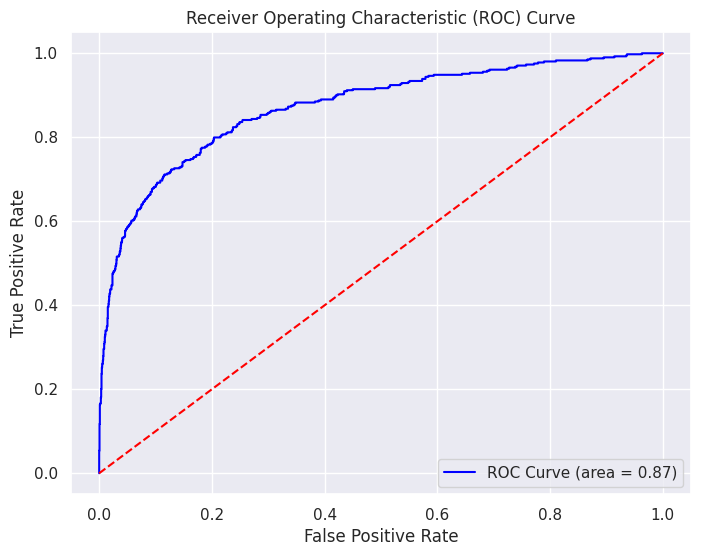

In [ ]:
# Initialize and train the XGBoost model
model = XGBClassifier(random_state=42)
model.fit(X_train_resampled, y_train_resampled)

# Predict probabilities on the test set
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate the ROC-AUC score
roc_auc_xgb = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC Score: {roc_auc_xgb:.2f}")

# Generate the ROC curve
fpr_xgb, tpr_xgb, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_xgb, tpr_xgb, color='blue', label=f'ROC Curve (area = {roc_auc_xgb:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

### SVM

ROC-AUC Score: 0.82


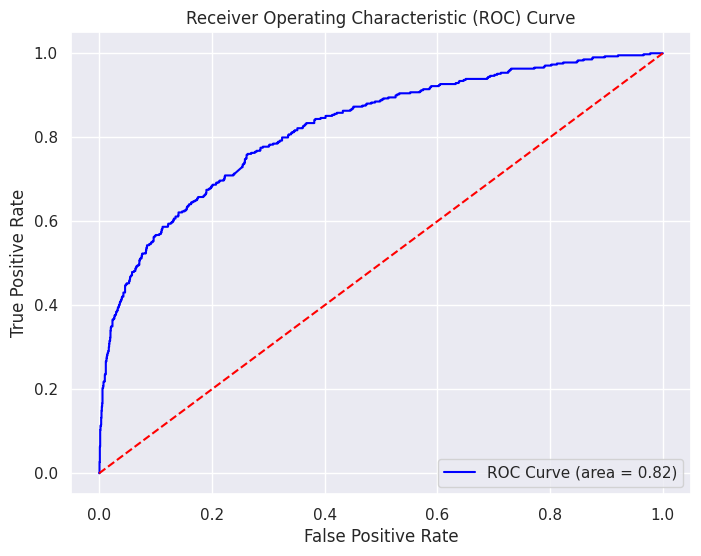

In [ ]:
# Initialize and train the SVM model with probability estimates
model = SVC(kernel='linear', probability=True, random_state=42)
model.fit(X_train_resampled, y_train_resampled)

# Predict probabilities on the test set
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate the ROC-AUC score
roc_auc_svm = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC Score: {roc_auc_svm:.2f}")

# Generate the ROC curve
fpr_svm, tpr_svm, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_svm, tpr_svm, color='blue', label=f'ROC Curve (area = {roc_auc_svm:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

## Validation and Testing

### K-Means and Agglomerative Clustering




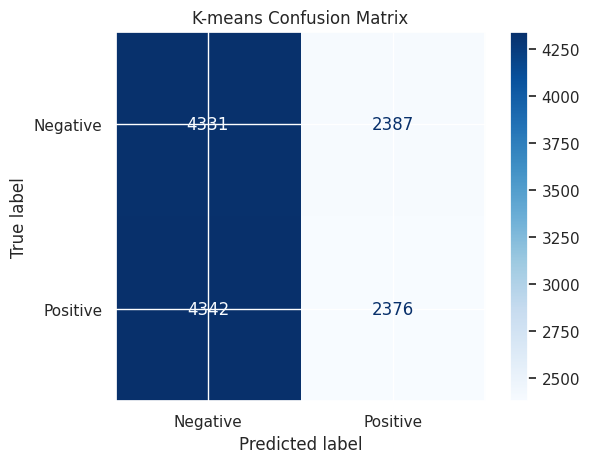

In [ ]:
kmeans_pred_binary = (cluster_labels == 1).astype(int)

# Generate the confusion matrix
cm_kmeans = confusion_matrix(y_train_resampled, kmeans_pred_binary)

# Plot the confusion matrix
disp_kmeans = ConfusionMatrixDisplay(confusion_matrix=cm_kmeans, display_labels=['Negative', 'Positive'])
disp_kmeans.plot(cmap=plt.cm.Blues)
plt.title("K-means Confusion Matrix")
plt.show()


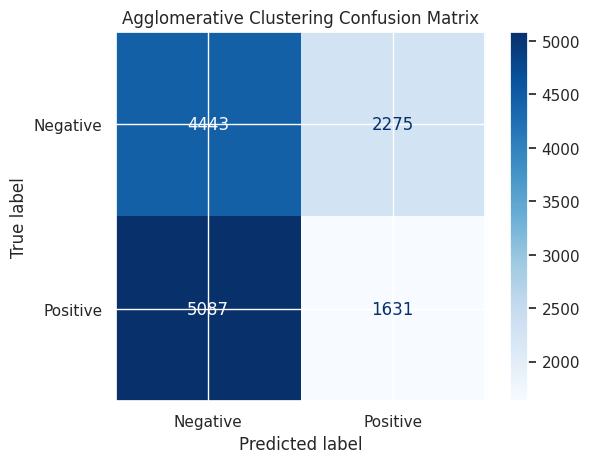

In [ ]:
agglo_pred_binary = (agg_labels == 1).astype(int)

# Generate the confusion matrix
cm_agglo = confusion_matrix(y_train_resampled, agglo_pred_binary)

# Plot the confusion matrix
disp_agglo = ConfusionMatrixDisplay(confusion_matrix=cm_agglo, display_labels=['Negative', 'Positive'])
disp_agglo.plot(cmap=plt.cm.Blues)
plt.title("Agglomerative Clustering Confusion Matrix")
plt.show()


### Logistic Regression and Neural Networks

In [ ]:
# Predict on the test set using Logistic Regression
y_pred_lr = lr_model.predict(X_test)
y_pred_proba_lr = lr_model.predict_proba(X_test)[:, 1]

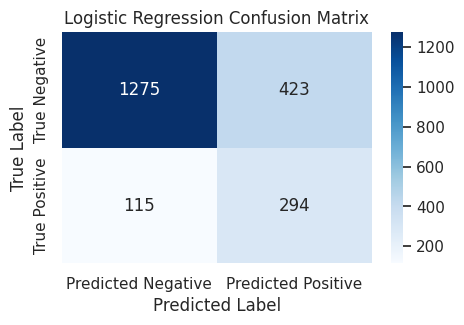

In [ ]:
# Compute the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
cm_df_lr = pd.DataFrame(cm_lr, index=['True Negative', 'True Positive'],
                        columns=['Predicted Negative', 'Predicted Positive'])

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['True Negative', 'True Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Logistic Regression Confusion Matrix')
plt.show()

66/66 [==============================] - 0s 1ms/step


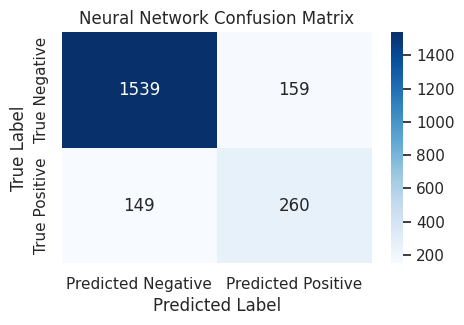

In [ ]:
# Predict on the test set using Nueral Network
y_pred_proba_nn = nn_model.predict(X_test)
y_pred_nn = (y_pred_proba_nn > 0.5).astype(int)

# Create a confusion matrix
cm_nn = confusion_matrix(y_test, y_pred_nn)
cm_df_nn = pd.DataFrame(cm_nn, index=['True Negative', 'True Positive'],
                     columns=['Predicted Negative', 'Predicted Positive'])

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(cm_nn, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['True Negative', 'True Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Neural Network Confusion Matrix')
plt.show()

### XG Boost and SVM

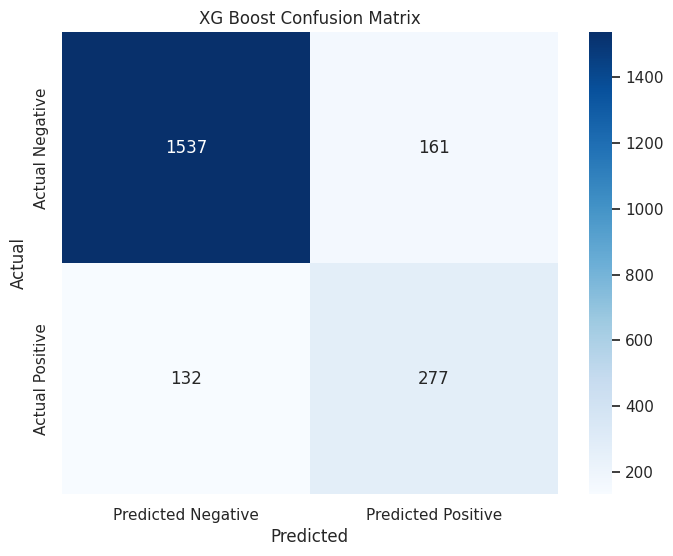

In [ ]:
# Initialize and train the XGBoost model
model_XGB = XGBClassifier(random_state=42)
model_XGB.fit(X_train_resampled, y_train_resampled)

# Predict on the test set
y_pred_XGB = model_XGB.predict(X_test)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_XGB)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('XG Boost Confusion Matrix')
plt.show()

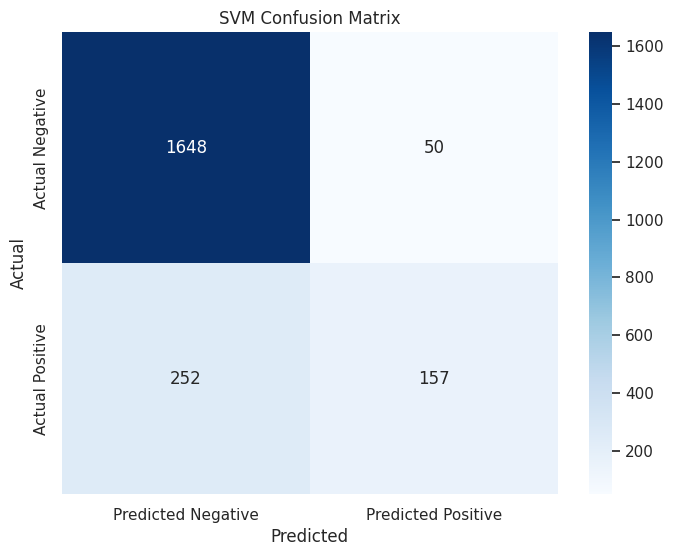

In [ ]:
# Initialize and train the SVM model with probability estimates
model_SVM = SVC(kernel='linear', probability=True, random_state=42)
model_SVM.fit(X_train, y_train)

# Predict on the test set
y_pred_SVM = model_SVM.predict(X_test)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_SVM)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('SVM Confusion Matrix')
plt.show()

## Model Performance Evaluation

### K-Means and Agglomerative Clustering

In [ ]:
# Print K-means classification report
print("K-means Classification Report:")
print(classification_report(y_test, binary_labels_test))

K-means Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.52      0.62      1698
           1       0.15      0.35      0.21       409

    accuracy                           0.49      2107
   macro avg       0.46      0.44      0.42      2107
weighted avg       0.65      0.49      0.54      2107



In [ ]:
# Print Agglomerative Clustering classification report
print("Agglomerative Clustering Classification Report:")
print(classification_report(y_test, binary_labels_test))

Agglomerative Clustering Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.52      0.62      1698
           1       0.15      0.35      0.21       409

    accuracy                           0.49      2107
   macro avg       0.46      0.44      0.42      2107
weighted avg       0.65      0.49      0.54      2107



### Logistic Regression and Neural Networks

In [ ]:
# Print classification report
print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.75      0.83      1698
           1       0.41      0.72      0.52       409

    accuracy                           0.74      2107
   macro avg       0.66      0.73      0.67      2107
weighted avg       0.82      0.74      0.77      2107



In [ ]:
# Print classification report
print("Neural Network Classification Report:")
print(classification_report(y_test, y_pred_nn))

Neural Network Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.91      0.91      1698
           1       0.62      0.64      0.63       409

    accuracy                           0.85      2107
   macro avg       0.77      0.77      0.77      2107
weighted avg       0.86      0.85      0.85      2107



In [ ]:
# Evaluate the final model on the test set
test_loss, test_accuracy = nn_model.evaluate(X_test, y_test)
print(f"Neaural Network Test Loss: {test_loss}")

66/66 [==============================] - 0s 1ms/step - loss: 0.4114 - accuracy: 0.8538
Neaural Network Test Loss: 0.41139963269233704


### XG Boost and SVM

In [ ]:
# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred_XGB))
print("XGB Classification Report:")
print(classification_report(y_test, y_pred_XGB))

Accuracy: 0.8609397247271001
XGB Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.91      0.91      1698
           1       0.63      0.68      0.65       409

    accuracy                           0.86      2107
   macro avg       0.78      0.79      0.78      2107
weighted avg       0.86      0.86      0.86      2107



In [ ]:
# Print classification report and accuracy
y_pred_SVM = model_SVM.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_SVM)
print(f"Accuracy: {accuracy:.2f}")
print("SVM Classification Report:")
print(classification_report(y_test, y_pred_SVM))


Accuracy: 0.86
SVM Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92      1698
           1       0.76      0.38      0.51       409

    accuracy                           0.86      2107
   macro avg       0.81      0.68      0.71      2107
weighted avg       0.85      0.86      0.84      2107



# AUC-ROC Model Performance Plot

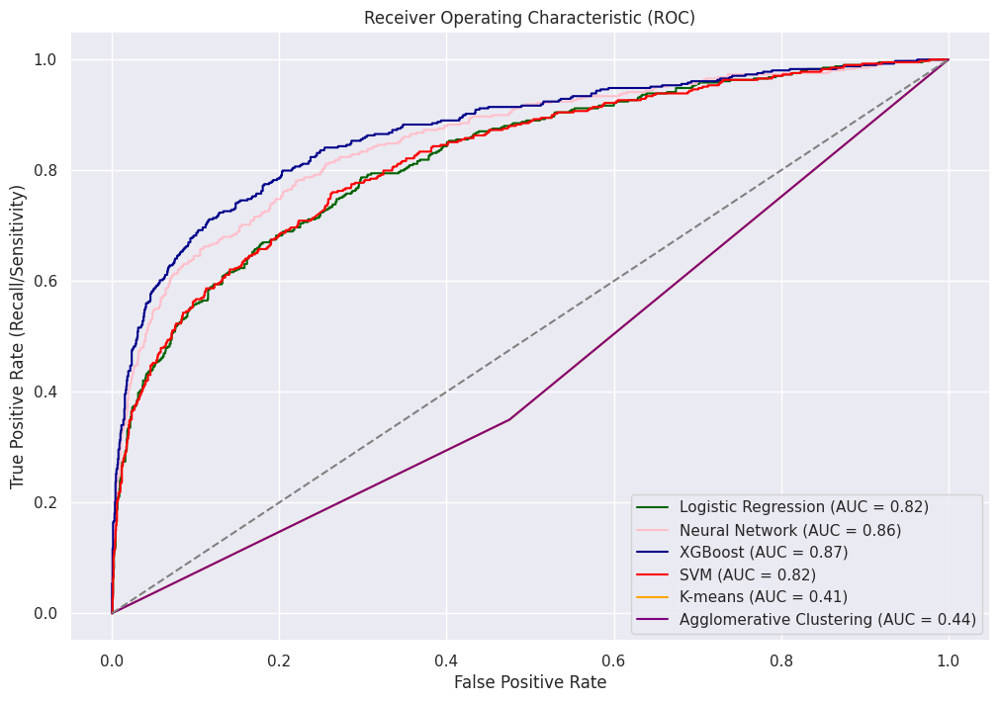

In [ ]:
# Calculate ROC AUC scores
roc_auc_lr = roc_auc_score(y_test, y_pred_proba_lr)
roc_auc_nn = roc_auc_score(y_test, y_pred_proba_nn)

# Compute ROC curves
fpr_lr, tpr_lr, _ = roc_curve(y_test, y_pred_proba_lr)
fpr_nn, tpr_nn, _ = roc_curve(y_test, y_pred_proba_nn)

roc_auc_kmeans = auc_score_kmeans
fpr_kmeans, tpr_kmeans, _ = roc_curve(y_test, binary_labels_test)

roc_auc_agg = auc_score_agg
fpr_agg, tpr_agg, _ = roc_curve(y_test, binary_labels_test)

# Plot ROC curves
plt.figure(figsize=(12, 8))
plt.plot(fpr_lr, tpr_lr, color='darkgreen',
         label=f'Logistic Regression (AUC = {roc_auc_lr:.2f})')
plt.plot(fpr_nn, tpr_nn, color='pink',
         label=f'Neural Network (AUC = {roc_auc_nn:.2f})')
plt.plot(fpr_xgb, tpr_xgb, color='darkblue',
         label=f'XGBoost (AUC = {roc_auc_xgb:.2f})')
plt.plot(fpr_svm, tpr_svm, color='red',
         label=f'SVM (AUC = {roc_auc_svm:.2f})')
plt.plot(fpr_kmeans, tpr_kmeans, color='orange',
         label=f'K-means (AUC = {roc_auc_kmeans:.2f})')
plt.plot(fpr_agg, tpr_agg, color='purple',
         label=f'Agglomerative Clustering (AUC = {roc_auc_agg:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall/Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()